# Using stable diffusion with huggingface diffusers

## Login

To access the models you have to be logged in and accept the licence.

In [1]:
from pathlib import Path
from huggingface_hub import notebook_login

if not (Path.home() / ".cache/huggingface/token").exists():
    notebook_login()

In [80]:
import logging

# Calm down the huggingface logging
logging.disable(logging.WARNING)

## Pipelines

In [3]:
import torch
from diffusers import StableDiffusionPipeline

# StableDiffusionPipeline is an e2e diffusion interence pipeline. Its a bit like a learner in fastai.
# We're using an existing model as opposed to traning a new one or fine tuning
pipe = StableDiffusionPipeline.from_pretrained(
    "Compvis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16
).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


  0%|          | 0/50 [00:00<?, ?it/s]

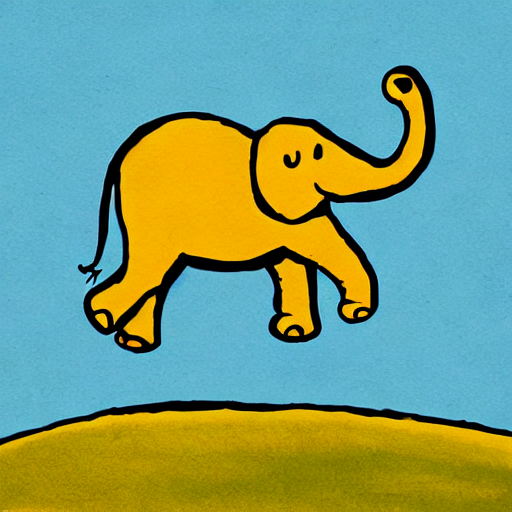

In [43]:
# Now we can give it prompts and get images
prompt = "flying elephant, cartoon"

torch.manual_seed(711)
pipe(prompt).images[0]

Stable diffusion is based on a progressive denoising algorithm that starts from random noise. It reduces the noise in each step. We can reduce the number of steps and keep the same seed to see this.

  0%|          | 0/8 [00:00<?, ?it/s]

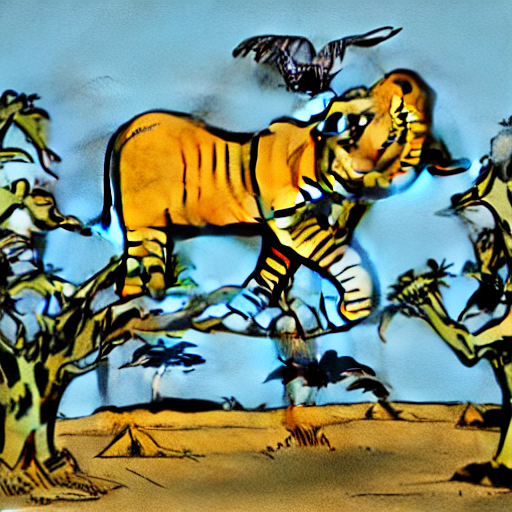

In [41]:
torch.manual_seed(711)
pipe(prompt, num_inference_steps=8).images[0]  # Trees in earlier steps?

### Classifier-free guidance

A way to increase/decrease the adherence of the output to the conditioning signal (text). Bigger == more adherence but usually less diversity.

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

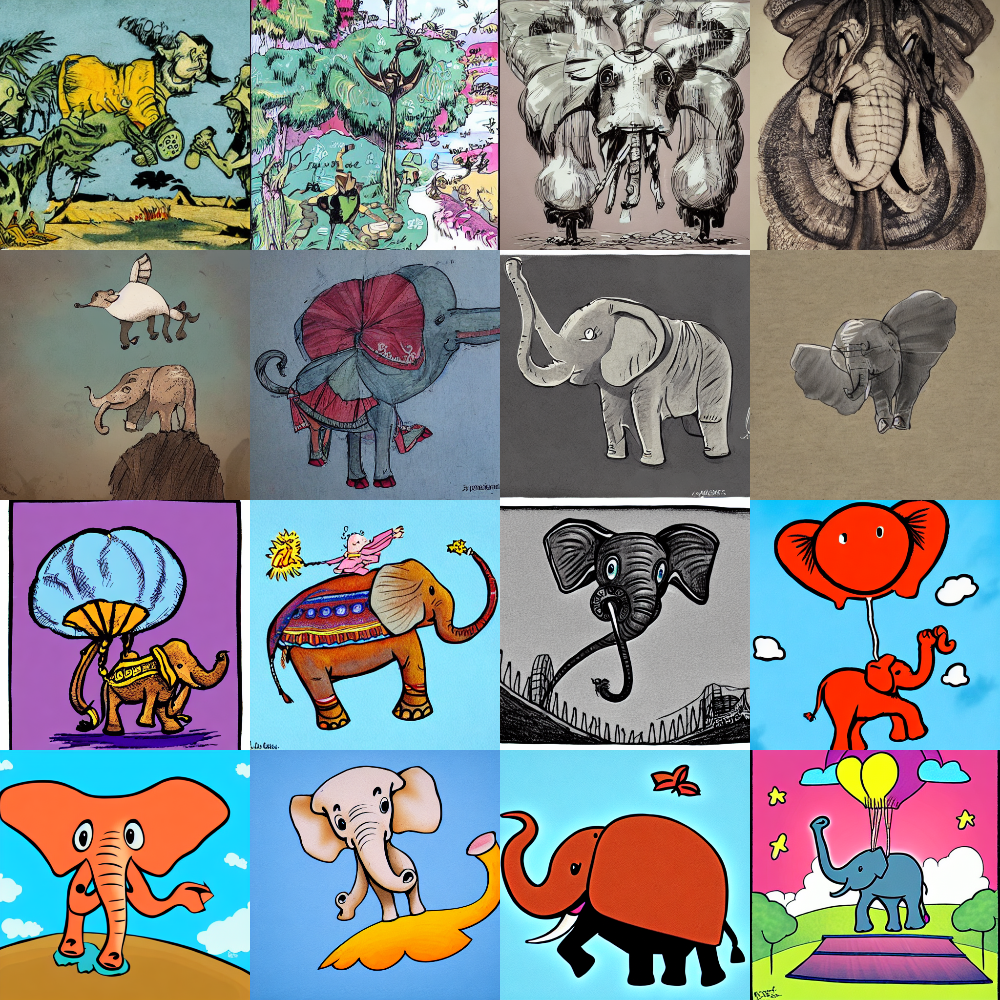

In [75]:
from fastcore.all import concat
from PIL import Image


# Helper function to show a grid of images as 1 image
def image_grid(images, rows, cols):
    width, height = images[0].size
    grid = Image.new("RGB", size=(cols * width, rows * height))

    for i, image in enumerate(images):
        grid.paste(image, box=(i % cols * width, i // cols * height))

    return grid


torch.manual_seed(711)
prompts = [prompt] * 4
images = concat(pipe(prompts, guidance_scale=g).images for g in [1, 3, 7, 14])
image_grid(images, 4, 4)

For every prompt, its creating two versions, one version with the prompt, and one with no prompt and takes the average. The guidance scale is a bit like its being used to weight the average.

### Negative prompts

Negative prompting is using another prompt and scaling the difference between the generations.

For every prompt make two images, one version with the prompt and one with the negative prompt. This time subtract the two.

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

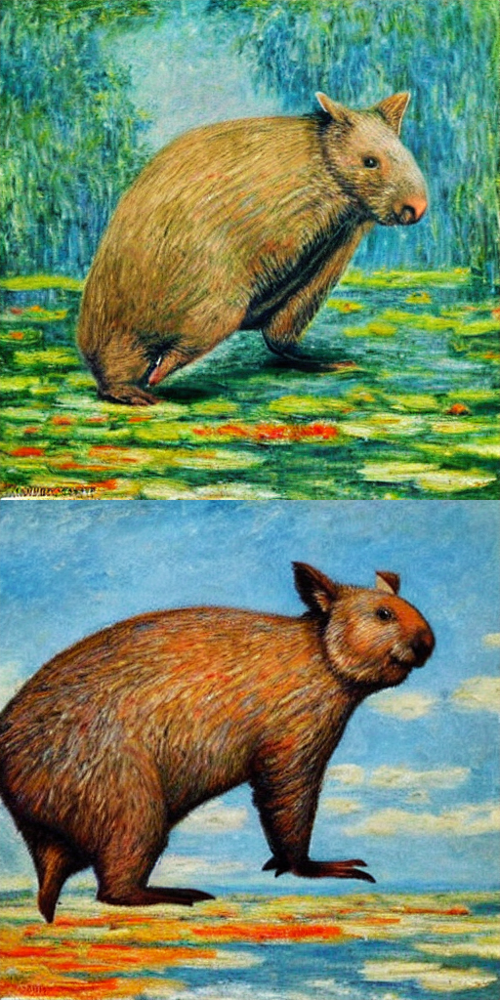

In [77]:
torch.manual_seed(711)
image_wo_neg = pipe("dancing wombat in the style of Monet").images[0]

torch.manual_seed(711)
image_w_neg = pipe("dancing wombat in the style of Monet", negative_prompt="green").images[0]

image_grid([image_wo_neg, image_w_neg], 2, 1)

### Image to image

We can use the raw image diffusion process for other tasks. Rather than start from noise we could start from an image + som noise, essentially pretenting that the image is what the first steps came up with.

In [79]:
from diffusers import StableDiffusionImg2ImgPipeline

img_pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16
).to("cuda")

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


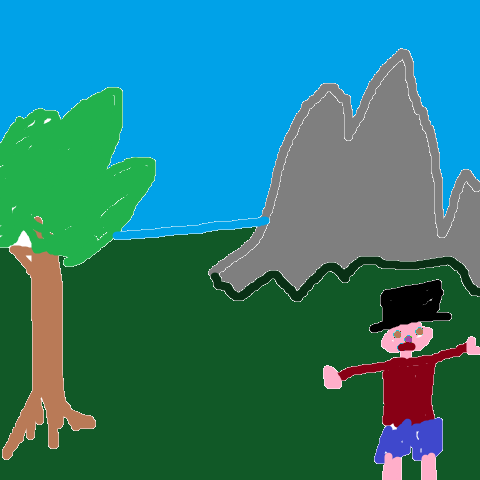

In [117]:
# Lets use a lovely sketch of a hiker as the base image
hiker_base = Image.open("data/landscape.png").convert("RGB")
hiker_prompt = "hiker at the bottom of a mountain with a tree on the left"

hiker_base

  0%|          | 0/40 [00:00<?, ?it/s]

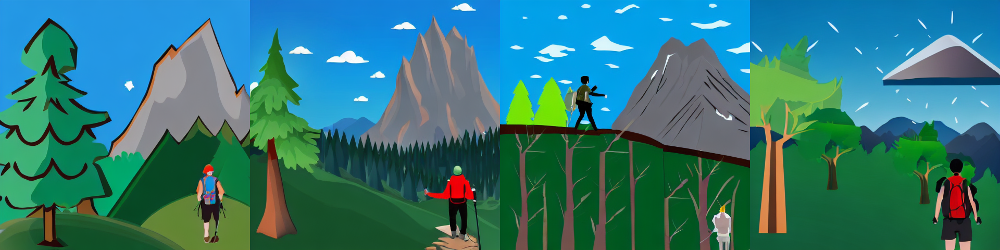

In [118]:
# Not bad
torch.manual_seed(711)
hiker_images = img_pipe(
    hiker_prompt, num_images_per_prompt=4, image=hiker_base, strength=0.8, num_inference_steps=50
).images

image_grid(hiker_images, rows=1, cols=4)

  0%|          | 0/50 [00:00<?, ?it/s]

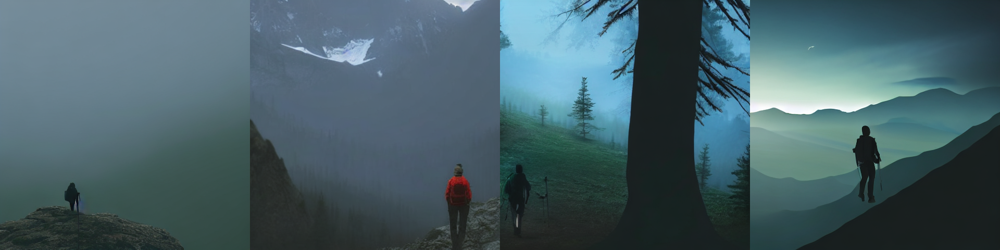

In [124]:
# We can now even now use one of these images as a new base to get closer to our goal
torch.manual_seed(711)
hiker_images_2 = img_pipe(
    hiker_prompt + ", hyperrealistic 4k, atmospheric, foggy",
    num_images_per_prompt=4,
    image=hiker_images[1],
    strength=1,
    num_inference_steps=50,
).images

image_grid(hiker_images_2, rows=1, cols=4)

### Fine tuning

You can fine tune a model on a set of images to "teach" it about things or bias it towards a certain style.

For example [Text to Pokemon](https://lambdalabs.com/blog/how-to-fine-tune-stable-diffusion-how-we-made-the-text-to-pokemon-model-at-lambda).

### Textual inversion

You can "teach" a new word to the text model and train its embeddings close to some visual representation. You add a new token to the vocab and freeze the weights of all the models except the text encoder, then train with representative images. This could be used to each about a new object or style.

You can also pick an existing, rare, token and fine tune it with additional meaning (potentially different to its original meaning).